### REAL ESTATE AGENT ########################

Steps to build the agent:

1. Use LLM to generate listings with images
2. Question about client preferences, life-style, interior, etc
3. Use LLM to generate a short description of an ideal apartment (not considering budget limit and interior design)
4. Build a vector database using mixed embeddings (listing descriptions are used to generate text embeddings while listing image are used to generate image embeddings)
5. Query listings using vector search (short description from step 3 and the interior design question are used to build the multimodal vector using text and image embeddings respectvelly)
6. Filter by some hard constraings (budget limit)
7. Present the final listing adapting the description to the user preferences

Tests:

To evaluate the agent we will run two scenarios:
1. A first search using a family apartament description
2. A second using exactly the same first search except by the interior design question

In [17]:
!pip install -qU numpy
!pip install -qU openai
!pip install -qU langchain-openai
!pip install -U --quiet lancedb pandas pydantic
!pip install pylance
!pip install --quiet datasets transformers clip

/Users/rafael.esquicato/Documents/projects/udacity-genai-workspace/venv/lib/python3.12/site-packages/lancedb/__init__.py:241: UserWarning: lance is not fork-safe. If you are using multiprocessing, use spawn instead.
  warnings.warn(
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)



[notice] A new release of pip is available: 24.2 -> 25.2
[notice] To update, run: pip install --upgrade pip


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)



[notice] A new release of pip is available: 24.2 -> 25.2
[notice] To update, run: pip install --upgrade pip


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)



[notice] A new release of pip is available: 24.2 -> 25.2
[notice] To update, run: pip install --upgrade pip


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)



[notice] A new release of pip is available: 24.2 -> 25.2
[notice] To update, run: pip install --upgrade pip


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)



[notice] A new release of pip is available: 24.2 -> 25.2
[notice] To update, run: pip install --upgrade pip


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)



[notice] A new release of pip is available: 24.2 -> 25.2
[notice] To update, run: pip install --upgrade pip


In [18]:
# loading environment variables (copy .env.dist to .env. and update OPEN_AI api key there)
from dotenv import load_dotenv
load_dotenv()  

True

In [19]:
import os
from langchain.prompts import PromptTemplate
from langchain.chat_models import ChatOpenAI 
import openai

client = openai.OpenAI(
    base_url = os.environ.get('BASE_URL'),
    api_key = os.environ.get('API_KEY')
)

llm = ChatOpenAI(model="gpt-3.5-turbo", temperature=0, api_key=os.environ["API_KEY"], base_url=os.environ.get('BASE_URL'))

In [20]:
import json

if not os.path.exists('listings.json'):
    response = llm.invoke(f"Generate 10 real estate listings for houses in the city of Porto, Portugal, the listing should include the following fields: price, number_of_bedrooms, square_footage, description and neighborhood_description, the format should be a JSON")

    listings = json.loads(response.content)
    with open('listings.json', 'w') as f:
        json.dump(listings, f)
else:
    with open('listings.json', 'r') as f:
        listings = json.load(f)


Listings images already created


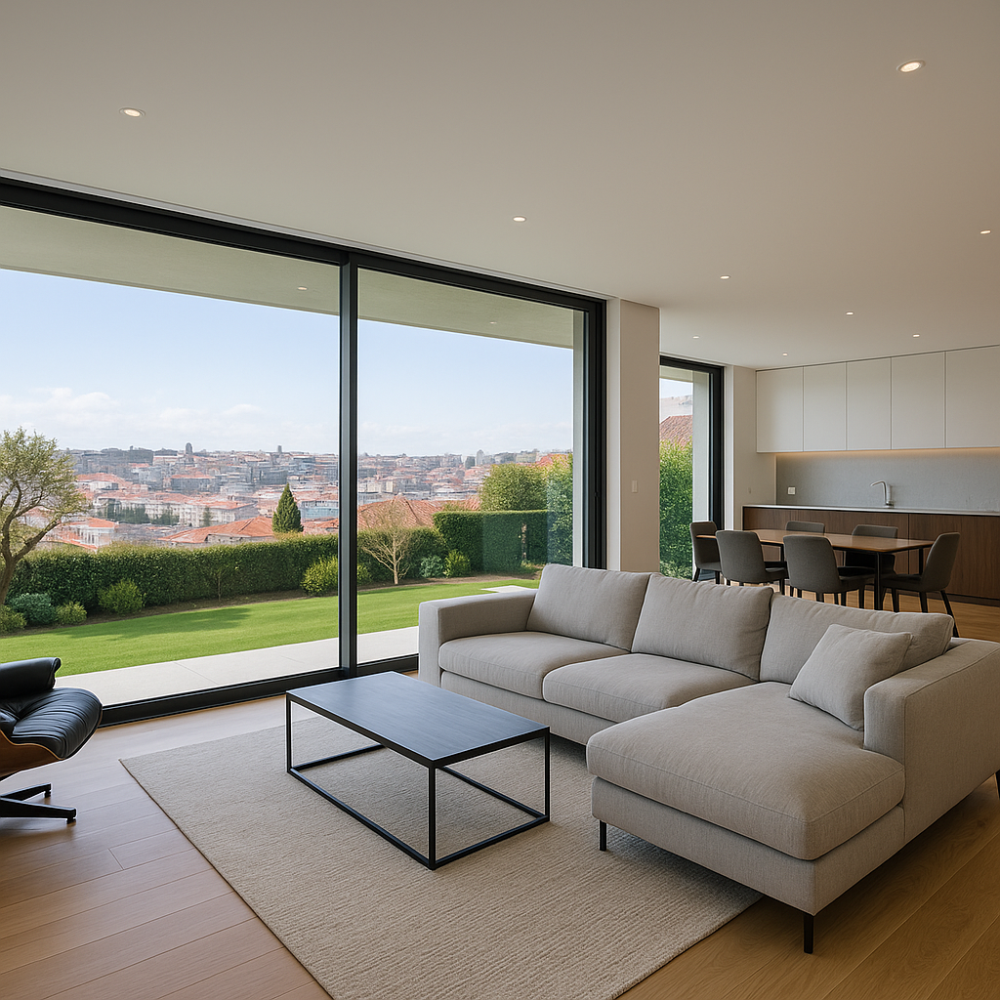

In [21]:
import base64
from PIL import Image

if (len(os.listdir('listings_images')) != len(listings)):  
    for i in range(len(listings)):
        listing = listings[i]
        prompt = f"Generate a realistic internal image for this listing in Porto City: {listing}"

        # Use OpenAI's image generation endpoint (DALL·E)
        img = client.images.generate(
            model="gpt-image-1",
            prompt=prompt,
            n=1,
            size="1024x1024"
        )

        image_bytes = base64.b64decode(img.data[0].b64_json)
        with open(f"listings_images/output_{i}.png", "wb") as f:
            f.write(image_bytes)
else:
    print('Listings images already created')

Image.open("listings_images/output_0.png")  # Display the first image as an example

Define the base questionnarie and fill the awnsers for the first scenario: Family with kids looking for calm places.

In [85]:
# questions to ask the user about their personal preferences
personal_questions = [  "Do you work in person or remotely?",
                        "Do you have kids?",
                        "Do you prefer vibrant neighborhoods or calm places?",
                        "Do you like to cook in your free time?",
                        "Do you prefer to spend time indoors or outdoors?",
                        "Describe how your perfect apartment interior would be.",
                        "What is your budget limit (in euros)?",
                       ]

# personal_answers = [ ] 
# for question in personal_questions:
#    answer = input(question)
#    personal_answers.append(answer)
    
# list of your personal answers to the questions above
# first scenario: family with kids
personal_answers = ['Remotely', 'Yes', 'Calm', 'Yes, I love!', 'Indoors', 'High ceiling', '500000']

In [86]:
def fill_questionaire(personal_questions, personal_answers, consider_interior_description = False, consider_budget = False):
    questionnaire = ""
    for i in range(len(personal_questions[0:-2])): # avoid the last two questions (interior description and budget)
        questionnaire += personal_questions[i] + " " + personal_answers[i] + "\n"
    if consider_interior_description:
        questionnaire += personal_questions[-2] + " " + personal_answers[-2] + "\n"
    if consider_budget:
        questionnaire += personal_questions[-1] + " " + personal_answers[-1] + "\n"
    return questionnaire
questionnaire = fill_questionaire(personal_questions, personal_answers)
print(questionnaire)

Do you work in person or remotely? Remotely
Do you have kids? Yes
Do you prefer vibrant neighborhoods or calm places? Calm
Do you like to cook in your free time? Yes, I love!
Do you prefer to spend time indoors or outdoors? Indoors



Generating the prompt to translate the questionarie in a listing description. Our embedding models has a token count limitation, so we adapted the prompt to generate a short description (comparing with real_estate.ipynb). The target description should not consider budget limit and interior design question (that will be used to filter by image embeddings)

In [87]:
prompt_target_description = PromptTemplate(
    template="{question}\n{questionnaire}",
    input_variables=["question","questionnaire"],
)
question_target_description = """
    You are a real estate agent. Based on the context provided, generate a short description (with one sentence only) of the ideal house for the user,
    taking into account their personal preferences described in the questionnaire below. 
"""

query = prompt_target_description.format(question = question_target_description, questionnaire = questionnaire)
print(query)


    You are a real estate agent. Based on the context provided, generate a short description (with one sentence only) of the ideal house for the user,
    taking into account their personal preferences described in the questionnaire below. 

Do you work in person or remotely? Remotely
Do you have kids? Yes
Do you prefer vibrant neighborhoods or calm places? Calm
Do you like to cook in your free time? Yes, I love!
Do you prefer to spend time indoors or outdoors? Indoors



Using the questionnarie, we will generate the description of the ideal listing for this user:

In [88]:
target_description = llm.invoke(query).content
print(target_description)

The ideal house for you is a spacious and modern home with a gourmet kitchen in a peaceful neighborhood, perfect for enjoying quality family time indoors.


Now it's time to create the embeddings for our vector database, we will build it using listing and neighboorhood descriptions (text embeddings) and listing image (image embeddings).

In [55]:
import transformers
from transformers import CLIPTokenizerFast
import torch
import numpy as np
from PIL import Image

MODEL_ID = "openai/clip-vit-base-patch32"

device = "cuda" if torch.cuda.is_available() else "cpu"
model = transformers.CLIPModel.from_pretrained(MODEL_ID).to(device)
preprocess = transformers.CLIPProcessor.from_pretrained(MODEL_ID)
tokenizer = CLIPTokenizerFast.from_pretrained(MODEL_ID)

/Users/rafael.esquicato/Documents/projects/udacity-genai-workspace/venv/lib/python3.12/site-packages/huggingface_hub/file_download.py:945: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [27]:
import time
import torch
import numpy as np
from PIL import Image

def create_multimodal_embedding(text_description, image_path=None, image_description=None, weights=(0.6, 0.4)):
    # text embedding
    inputs = tokenizer([text_description], padding=True, return_tensors="pt").to(device)
    text_features = model.get_text_features(**inputs)
    text_embedding = text_features.detach().numpy()[0]

    # image embeddings
    if image_path is not None:
        image = preprocess(text=None, images=[Image.open(image_path)], return_tensors="pt")["pixel_values"].to(device)
        img_features = model.get_image_features(image)
        img_embedding = img_features.detach().numpy()[0]
    elif image_description is not None:
         inputs = tokenizer([image_description], padding=True, return_tensors="pt").to(device)
         img_features = model.get_text_features(**inputs)
         img_embedding = img_features.detach().numpy()[0]
    else:
        raise ValueError("Either image_path or image_description must be provided.")
    
    # combine with weights
    text_weight, image_weight = weights
    combined_embedding = (
        text_weight * text_embedding + 
        image_weight * img_embedding
    )
    
    # normalize final embedding
    combined_embedding = combined_embedding / np.linalg.norm(combined_embedding)
    
    return combined_embedding.flatten()

print(f"Total listings to process: {len(listings)}")

# Generate embeddings for all listings
print("Generating embeddings for listings...")
embeddings = []
batch_size = 10  # Process in batches to avoid rate limits

for i in range(0, len(listings), batch_size):
    batch = listings[i:i+batch_size]
    batch_texts = [listing['description'] + " " + listing['neighborhood_description'] for listing in batch]
    batch_image_paths = [f"listings_images/output_{i+j}.png" for j in range(len(batch))]
    
    try:
        batch_embeddings = []
        for j in range(len(batch)):
            batch_embeddings.append(create_multimodal_embedding(text_description=batch_texts[j], image_path=batch_image_paths[j]))

        embeddings.extend(batch_embeddings)
        
        print(f"Processed batch {i//batch_size + 1}/{(len(listings) + batch_size - 1)//batch_size}")
        
        # Small delay to respect rate limits
        time.sleep(0.1)
        
    except Exception as e:
        print(f"Error processing batch {i//batch_size + 1}: {e}")
        break

print(f"Generated {len(embeddings)} embeddings")

Total listings to process: 10
Generating embeddings for listings...
Processed batch 1/1
Generated 10 embeddings


Now we will create the lancedb table listings to save our listings along with the embeddings.

In [28]:
import lancedb

def convert_to_float(price_str):
    try:
        return float(price_str.replace("$", "").replace(",", "").replace("\u20ac", "").strip())
    except ValueError:
        return 0.0

db = lancedb.connect("./lancedb_image")

# Prepare data for LanceDB
lance_data = []
for i, listing in enumerate(listings):
    if i < len(embeddings):
        lance_data.append({
            "id": i,
            "number_of_bedrooms": listing['number_of_bedrooms'],
            "square_footage": listing['square_footage'],
            "description": listing['description'],
            "neighborhood_description": listing['neighborhood_description'],
            "price": convert_to_float(listing['price']),
            "vector": embeddings[i]
        })

print(f"Prepared {len(lance_data)} listings for LanceDB")

# Create table (drop if exists)
try:
    db.drop_table("listings")
except:
    pass

table = db.create_table("listings", lance_data)
print("Created LanceDB table with listings and embeddings")

Prepared 10 listings for LanceDB
Created LanceDB table with listings and embeddings


In [29]:
def similarity_search(table, query_text: str, query_image: str, top_k: int = 5, budget_limit: float = None):
    # Generate embedding for the query
    print(f"Searching for: '{query_text}'")

    query_embedding = create_multimodal_embedding(
        text_description=query_text, 
        image_description=query_image, 
        weights=(0.6, 0.4)
    )

    # Perform similarity search using LanceDB
    results = table.search(query_embedding).where(f"price < {budget_limit}").limit(top_k).to_pandas()

    # Format results
    search_results = []
    for _, row in results.iterrows():
        search_results.append((
            row['id'],
            row['description'] + " " + row['neighborhood_description'],
            row['price'],
            row['_distance']
        ))
    
    return search_results
        

Now we can finally search for the best listing using the target_descrition, the interior design response and the budget limit:

In [89]:
results = similarity_search(table, target_description, personal_answers[-2], top_k=3, budget_limit=float(convert_to_float(personal_answers[-1])))

print(f"\nTop 3 listings:")
for i, (listing_id, text, price, distance) in enumerate(results, 1):
    print(f"\n{i}. Listing ID: {listing_id}")
    print(f"   Price: {price}")
    print(f"   Distance: {distance:.4f}")
    print(f"   Text: {text}")
    print("-" * 80)

Searching for: 'The ideal house for you is a spacious and modern home with a gourmet kitchen in a peaceful neighborhood, perfect for enjoying quality family time indoors.'

Top 3 listings:

1. Listing ID: 5
   Price: 400000.0
   Distance: 0.4748
   Text: A modern duplex with a large living room, fully equipped kitchen, and a private terrace. The house is furnished with minimalist, contemporary pieces. A vibrant and artistically-plentiful neighborhood, filled with galleries, live music venues, and creative businesses.
--------------------------------------------------------------------------------

2. Listing ID: 6
   Price: 300000.0
   Distance: 0.5529
   Text: Charming and well-maintained apartment with a private garden, a spacious kitchen, and hardwood floors. Located in a family-friendly neighborhood offering many recreational parks, trendy cafes, and grocery stores.
--------------------------------------------------------------------------------

3. Listing ID: 9
   Price: 350000.0

This is the prompt to personalize the listing to our user:

In [90]:
prompt_final_presentation = PromptTemplate(
    template="{question}\nQUESTIONNAIRE:\n{questionnaire}\nLISTING:\n{listing}",
    input_variables=["question","questionnaire","listing"],
)
question_final_presentation = """
    You are a real estate agent that needs to present a property listing. Based on the context provided, generate the best description of the ideal house for the user,
    taking into account their personal preferences described in the questionnaire and listing below.
"""
if results:
    listing = listings[results[0][0]]
    listing_image_path = f"listings_images/output_{results[0][0]}.png"
else:
    raise ValueError("No listings found")
query = prompt_final_presentation.format(question = question_final_presentation, questionnaire = fill_questionaire(personal_questions, personal_answers, consider_interior_description = True), listing = listing)
print(query)



    You are a real estate agent that needs to present a property listing. Based on the context provided, generate the best description of the ideal house for the user,
    taking into account their personal preferences described in the questionnaire and listing below.

QUESTIONNAIRE:
Do you work in person or remotely? Remotely
Do you have kids? Yes
Do you prefer vibrant neighborhoods or calm places? Calm
Do you like to cook in your free time? Yes, I love!
Do you prefer to spend time indoors or outdoors? Indoors
Describe how your perfect apartment interior would be. High ceiling

LISTING:
{'price': '€400,000', 'number_of_bedrooms': 3, 'square_footage': 1800, 'description': 'A modern duplex with a large living room, fully equipped kitchen, and a private terrace. The house is furnished with minimalist, contemporary pieces.', 'neighborhood_description': 'A vibrant and artistically-plentiful neighborhood, filled with galleries, live music venues, and creative businesses.'}


And finally present the final recommendation for our family looking for a new home:

**** Welcome to your new home!******

Based on your preferences, I have found the perfect house for you! This modern duplex is priced at €400,000 and features 3 bedrooms with a square footage of 1800. The house has a high ceiling, perfect for your preference for spacious interiors. 

The property includes a large living room, fully equipped kitchen (ideal for your love of cooking), and a private terrace for some outdoor relaxation. The house is furnished with minimalist, contemporary pieces, catering to your preference for a modern interior design.

Located in a calm neighborhood, this house provides the tranquility you desire while still offering easy access to amenities. This property is perfect for remote work and spending quality time indoors with your kids. Don't miss out on this ideal home that perfectly aligns with your preferences!


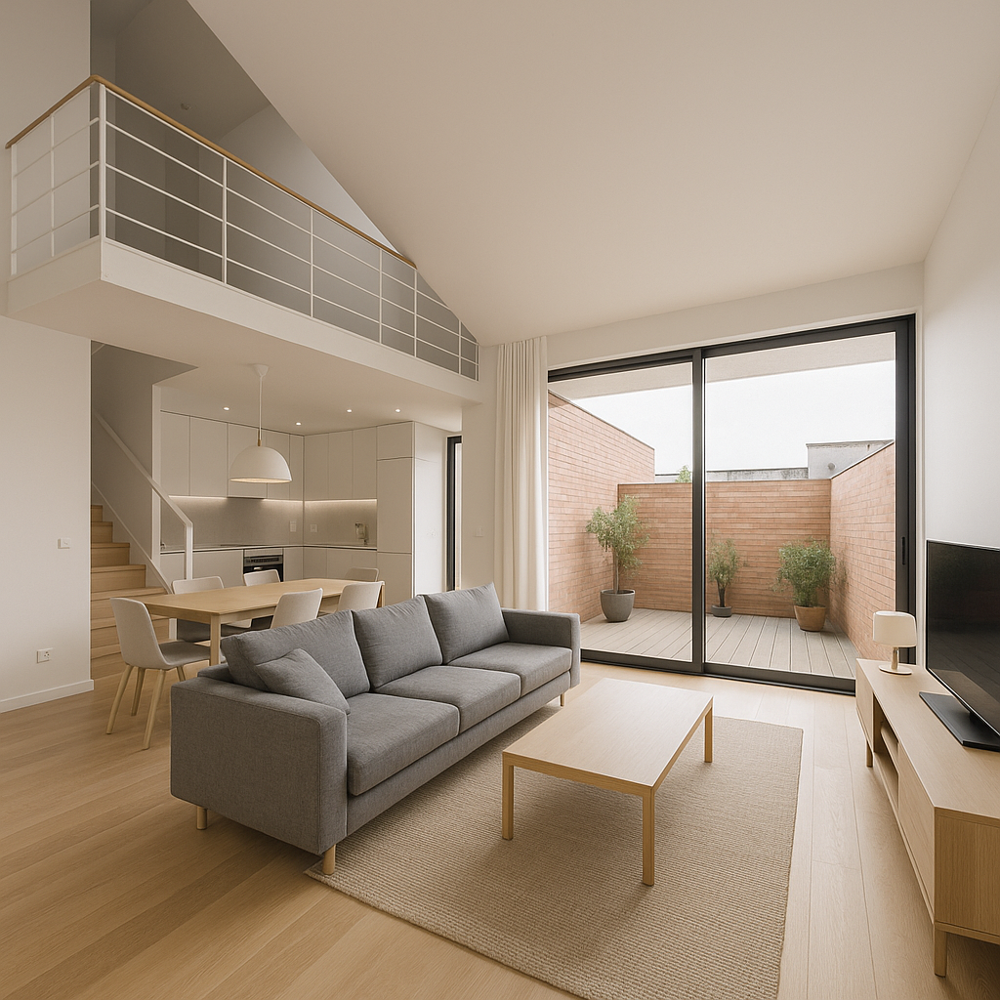

In [91]:
recommended_description = llm.invoke(query).content
print("**** Welcome to your new home!******\n")
print(recommended_description)
Image.open(listing_image_path) 

To test our agent, we will use basically the same awnsers only adapting the interior design question that affects the image embedding, the result is different now:

Searching for: 'The ideal house for you is a spacious and modern home with a large kitchen for your cooking passion, located in a peaceful neighborhood perfect for your remote work and family life.'

1. Listing ID: 6
   Price: 300000.0
   Distance: 0.4225
   Text: Charming and well-maintained apartment with a private garden, a spacious kitchen, and hardwood floors. Located in a family-friendly neighborhood offering many recreational parks, trendy cafes, and grocery stores.
--------------------------------------------------------------------------------

2. Listing ID: 5
   Price: 400000.0
   Distance: 0.4245
   Text: A modern duplex with a large living room, fully equipped kitchen, and a private terrace. The house is furnished with minimalist, contemporary pieces. A vibrant and artistically-plentiful neighborhood, filled with galleries, live music venues, and creative businesses.
--------------------------------------------------------------------------------

3. Listing ID: 9
   Price

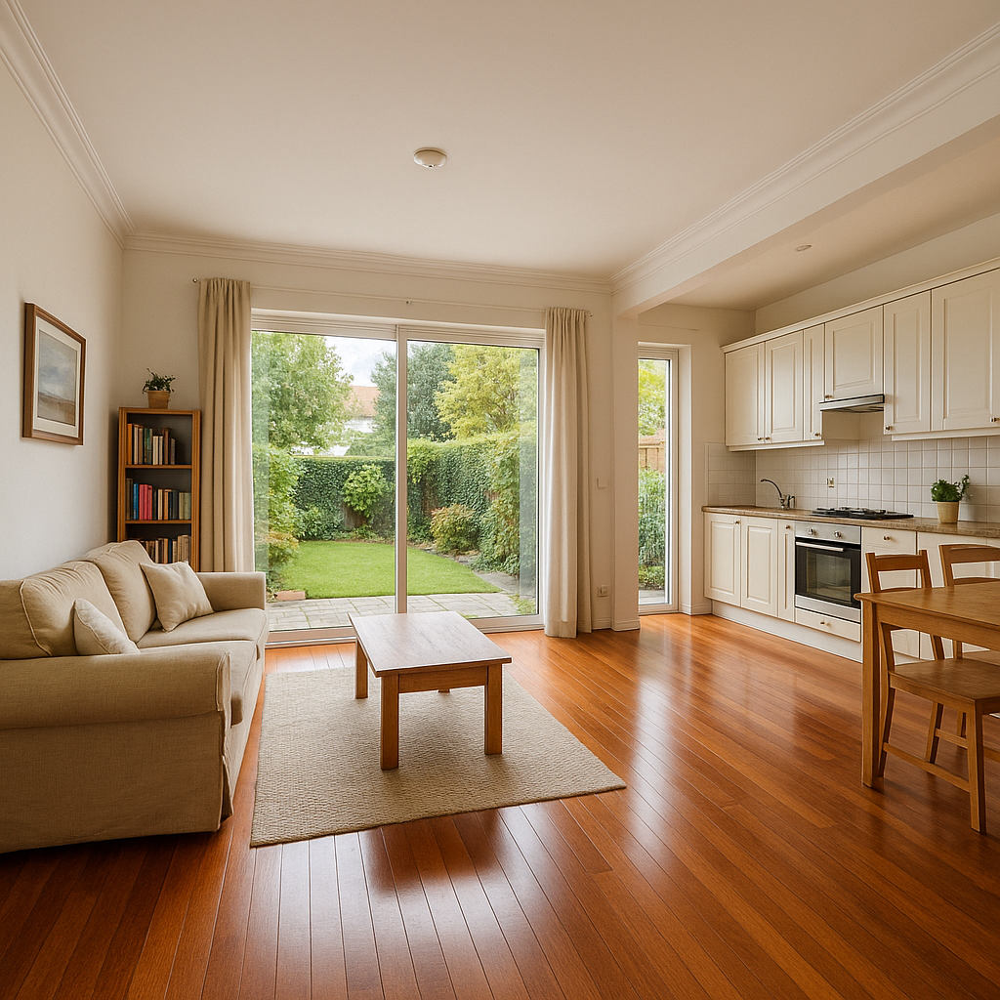

In [ ]:
### Exactly the same search but changing the interior design question answer
personal_answers = ['Remotely', 'Yes', 'Calm', 'Yes, I love!', 'Indoors', 'Spacious and bright with a large kitchen, garden access, space for books and hardwood floor.', '500000']

query = prompt_target_description.format(question = question_target_description, questionnaire = fill_questionaire(personal_questions, personal_answers))
target_description = llm.invoke(query).content

results = similarity_search(table, target_description, personal_answers[-2], top_k=3, budget_limit=float(convert_to_float(personal_answers[-1])))
for i, (listing_id, text, price, distance) in enumerate(results, 1):
    print(f"\n{i}. Listing ID: {listing_id}")
    print(f"   Price: {price}")
    print(f"   Distance: {distance:.4f}")
    print(f"   Text: {text}")
    print("-" * 80)

if results:
    listing = listings[results[0][0]]
    listing_image_path = f"listings_images/output_{results[0][0]}.png"
else:
    raise ValueError("No listings found")
query = prompt_final_presentation.format(question = question_final_presentation, questionnaire = fill_questionaire(personal_questions, personal_answers, consider_interior_description=True), listing = listing)

recommended_description = llm.invoke(query).content
print("**** Welcome to your new home!******\n")
print(recommended_description)
Image.open(listing_image_path) 